# Simple Models for Deep Neural Network Testing

In [16]:
from __future__ import print_function
import numpy as np
import tensorflow as tf
import random
import math
import time
import matplotlib.pyplot as plt
%matplotlib inline

#Our simple models will be:
# Two classes: in/out of the model
num_labels = 2
# Two dimensions: x,y coordinates 
dimensions = 2
#Train, valid & test datasets will be similar to the notMNIST example
train_dataset_size = 200000
valid_dataset_size = 10000
test_dataset_size = 10000
#A random seed so we can regenerate
random_seed_base = 19700601

#Generate a dataset from a defined model.
#  fun: model function receives (x,y) vector and returns class (0/1, in/out, T/F, etc)
#  num: number of samples to generate (default:10000)
#  seed_num: integer to add to the random seed. Vary it to get different datasets (but repeatable)
#    seed_num suggestion: train +0 test +1 valid +2

def generate_dataset(fun,num=10000,seed_num=1):
    random.seed(random_seed_base+seed_num)

    data = np.ndarray(shape=(num,dimensions), dtype=float)
    labels = np.ndarray(shape=(num), dtype=float)

    #in case you want to save to a file the dataset:
    #fo = open(fn,"w")
    for i in range(num):
        #samples are taken from a uniform distribution 
        x = random.uniform(-1,1)
        y = random.uniform(-1,1)

        l = fun(x,y)     

        data[i,0] = x
        data[i,1] = y
        labels[i] = l
#        fo.write( "%f,%f,%f\n" % (x,y,l) )
#    fo.close()
    return data,labels

#load a dataset from file
def read_dataset(fn,numrec):
    f = open(fn,"r")
    data = np.ndarray(shape=(numrec,dimensions), dtype=float)
    labels = np.ndarray(shape=(numrec), dtype=float)
    n = 0
    for line in f:
        x,y,l = line.split(",")
        data[n,0] = float(x)
        data[n,1] = float(y)
        labels[n] = float(l)
        n+=1
    f.close()
    return data, labels

#Utility functions from the original example
def reformat(dataset, labels):
  dataset = dataset.reshape((-1, dimensions)).astype(np.float32)
  # Map 2 to [0.0, 1.0, 0.0 ...], 3 to [0.0, 0.0, 1.0 ...]
  labels = (np.arange(num_labels) == labels[:,None]).astype(np.float32)
  return dataset, labels

def accuracy(predictions, labels):
  return (100.0 * np.sum(np.argmax(predictions, 1) == np.argmax(labels, 1))
          / predictions.shape[0])

def save_predictions(predictions,labels,fun):
    fo = open(fun+"_predictions.csv","w")
    [fo.write("%f\n" % item) for item in np.argmax(predictions, 1)]
    fo.close()

#Make a plot to show the training data and the test data. Test data is marked as correctly or incorrectly classified.
def plot_predictions(train_dataset,train_labels,test_dataset,test_labels,test_predictions,title=""):
    X = [i[0] for i in train_dataset]
    Y = [i[1] for i in train_dataset]
    #Train data is plotted in light/dark blue dots depending on it's label
    col = ("#add8e6","#4682b4")
    c = [ col[np.argmax(i)] for i in train_labels ]
    px = [i[0] for i in test_dataset]
    py = [i[1] for i in test_dataset]
    
    #Test data is plotted in light-gray or red circles depending if its correctly o incorrecly classified
    tl = [ np.argmax(i) for i in test_labels ]
    pl = [ np.argmax(i) for i in test_predictions ]
    l = []
    for i in range(len(tl)):
        l.append("#888888" if tl[i]==pl[i] else "#ff0000")

    plt.figure(figsize=(10,10), dpi=80)
    plt.xlim(-1,1)
    plt.ylim(-1,1)
    plt.scatter(X,Y,c=c,s=20,alpha=0.5,marker=".",edgecolors="face")
    plt.scatter(px,py,c=l,s=20,alpha=0.3,marker="o",edgecolors="none")
    if title != "":
        plt.title(title)
    plt.show()
    
   

In [17]:
 
#Model Functions - from simple to a little more complex
#  each model receives the coordinates of a sample and returns it's class
#  optionaly receives a parameter r used to modify in some way the model

#Almost trivial: class positive if X is positive
def positivos(x,y,r=0):
    return (x > r)

#Simple linear: positive if Y > than X 
def linear(x,y):
    return (y > x)

#A circle: positive if (x,y) is inside a circle of radius r
def circle(x,y,r=0.75):
    return ( x*x+y*y < r*r )

#A ring: positive if (x,y) is inside of a circle of radius r but outside an inner circle or radius r/2
def ring(x,y,r=0.75):
    return (x*x+y*y < r*r) and (x*x+y*y > (r/2)*(r/2))

#A cosine: positive if (x,y) is above a cosine of frequency r
def cos(x,y,r=8):
    return ((y) - (math.cos(r*x)) > 0 )

#A polar cosine ("rose of n-petals"): Positive if (x,y) is inside the "rose"
def polar(x,y,r=4):
    rr = math.sqrt(x*x+y*y)
    th = math.atan(y/x)
    return ( rr < math.sin(r*th) ) 

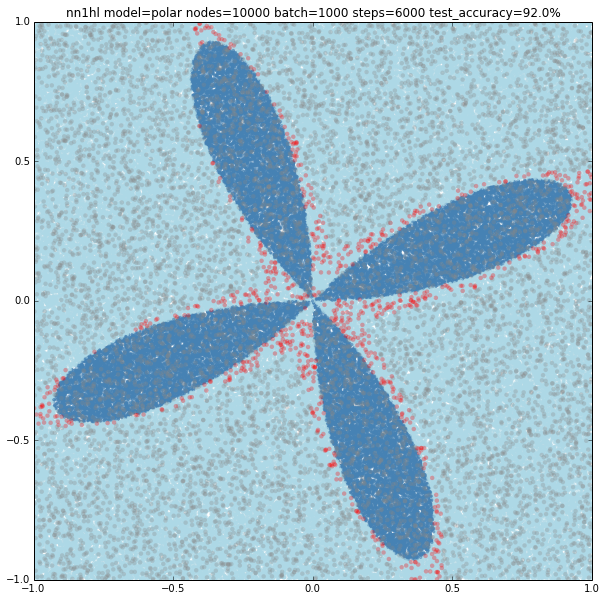

Total time 750.098954
ok


In [94]:
#NN with one hidden layer
def nn1hl(fun,num_nodes=100,
          batch_size=1000,num_steps=3001,
          beta=0.00125,w_init_stddev=0.0441,
          trace=True):
    
    dt,lt = generate_dataset(fun,train_dataset_size,0)
    ds,ls = generate_dataset(fun,test_dataset_size,1)
    dv,lv = generate_dataset(fun,valid_dataset_size,2)
    #d,l = read_dataset(fun+"_train_dataset.csv",train_dataset_size)
    #d,l = read_dataset(fun+"_valid_dataset.csv",valid_dataset_size)
    #d,l = read_dataset(fun+"_test_dataset.csv",test_dataset_size)

    train_dataset,train_labels = reformat(dt,lt)
    valid_dataset,valid_labels = reformat(ds,ls)
    test_dataset,test_labels = reformat(dv,lv)

    graph = tf.Graph()
    with graph.as_default():

      # Input data. For the training data, we use a placeholder that will be fed
      # at run time with a training minibatch.
      tf_train_dataset = tf.placeholder(tf.float32,
                                        shape=(batch_size, dimensions))
      tf_train_labels = tf.placeholder(tf.float32, shape=(batch_size, num_labels))
      tf_valid_dataset = tf.constant(valid_dataset)
      tf_test_dataset = tf.constant(test_dataset)

      # Variables.
      #efv
      weights = tf.Variable(
        tf.truncated_normal([dimensions, num_nodes],stddev=w_init_stddev))
      biases = tf.Variable(tf.zeros([num_nodes]))
      weights2 = tf.Variable(
        tf.truncated_normal([num_nodes, num_labels],stddev=w_init_stddev))
      biases2 = tf.Variable(tf.zeros([num_labels]))

      # Training computation.
      hidden1 = tf.nn.relu(tf.matmul(tf_train_dataset, weights) + biases)
      logits = tf.matmul(hidden1,weights2) + biases2

      loss = tf.reduce_mean(
        tf.nn.softmax_cross_entropy_with_logits(logits,tf_train_labels)) + beta*tf.nn.l2_loss(weights) + beta*tf.nn.l2_loss(weights2)
    #org 
    #    tf.nn.softmax_cross_entropy_with_logits(logits, tf_train_labels))

      # Optimizer.
      optimizer = tf.train.GradientDescentOptimizer(0.5).minimize(loss)

      # Predictions for the training, validation, and test data.
      train_prediction = tf.nn.softmax(logits)
      valid_prediction = tf.nn.softmax(
        tf.matmul(tf.nn.relu(tf.matmul(tf_valid_dataset, weights) + biases),weights2)+biases2)
      test_prediction = tf.nn.softmax(
        tf.matmul(tf.nn.relu(tf.matmul(tf_test_dataset, weights) + biases),weights2)+biases2)

    with tf.Session(graph=graph) as session:
      ts = time.time()
      tf.initialize_all_variables().run()
      #print("Initialized")
      for step in range(num_steps):
        t = time.time()
        # Pick an offset within the training data, which has been randomized.
        # Note: we could use better randomization across epochs.
        offset = (step * batch_size) % (train_labels.shape[0] - batch_size)
        # Generate a minibatch.
        batch_data = train_dataset[offset:(offset + batch_size), :]
        batch_labels = train_labels[offset:(offset + batch_size), :]
        # Prepare a dictionary telling the session where to feed the minibatch.
        # The key of the dictionary is the placeholder node of the graph to be fed,
        # and the value is the numpy array to feed to it.
        feed_dict = {tf_train_dataset : batch_data, tf_train_labels : batch_labels}
        _, l, predictions = session.run(
          [optimizer, loss, train_prediction], feed_dict=feed_dict)
        if (step % 500 == 0) and trace:
          print("Minibatch loss at step %d: %f" % (step, l))
          print("Minibatch accuracy: %.1f%%" % accuracy(predictions, batch_labels))
          print("Validation accuracy: %.1f%%" % accuracy(
            valid_prediction.eval(), valid_labels))
          print("Minibatch time %f" % (time.time()-t) )
      accu = accuracy(test_prediction.eval(), test_labels)
      #print("Test accuracy: %.1f%%" % accu)
      pp = test_prediction.eval()
      #save_predictions(pp,test_labels,fun)
      plot_title = "nn1hl model=%s nodes=%d batch=%d steps=%d test_accuracy=%.1f%%" % (fun.__name__, num_nodes, batch_size, num_steps, accu)
      plot_predictions(train_dataset,train_labels,test_dataset,test_labels,pp,title=plot_title)
      print("Total time %f" % (time.time() - ts) )


#Iterate over parameters and generate *a lot* of examples - then check most interesting
#for model in (positivos,linear,circle,ring,cos,polar):
#    for nn in (1,10,100,1000):
#        for bs in (100,1000):
#            for s in (11,1001,6001):
            #print("steps %d" % s)
#                nn1hl(fun=model, num_nodes=nn, num_steps = s, batch_size=bs, trace=False)    


nn1hl(fun=polar, num_nodes=10000, batch_size=1000, num_steps=6000, trace=False) 
print("ok")

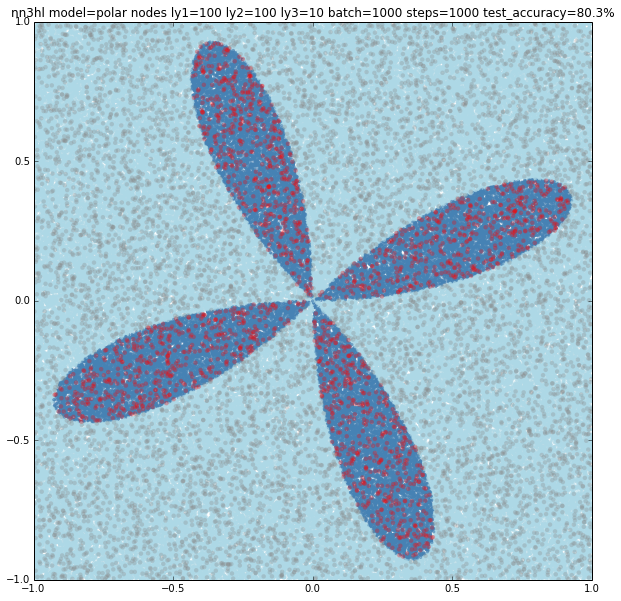

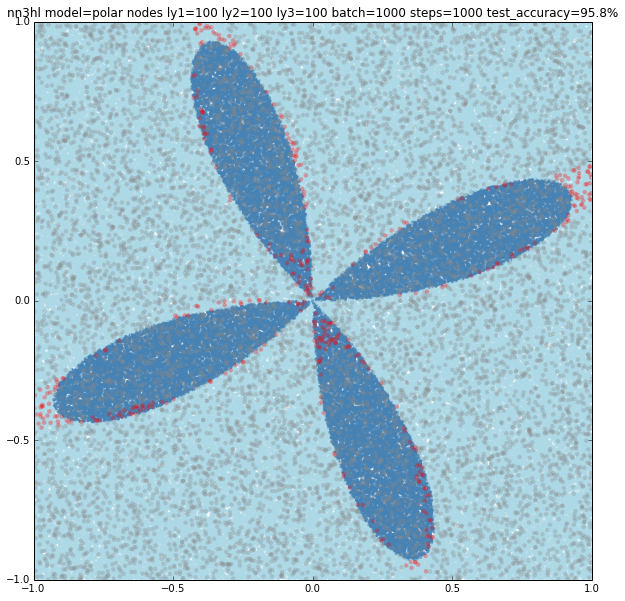

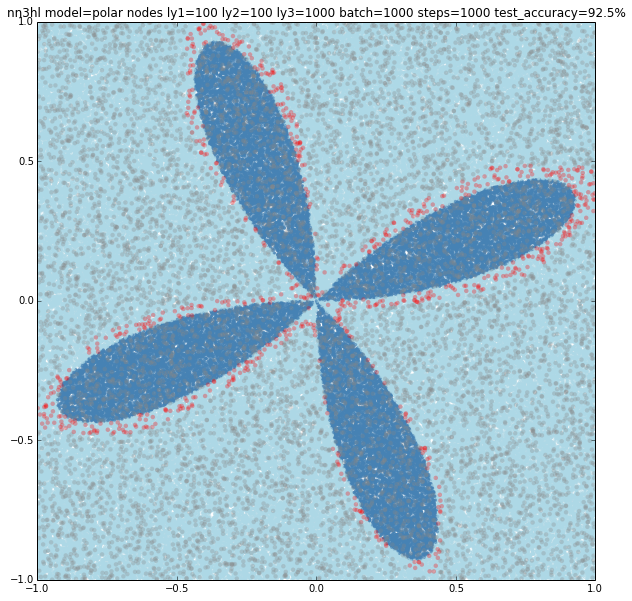

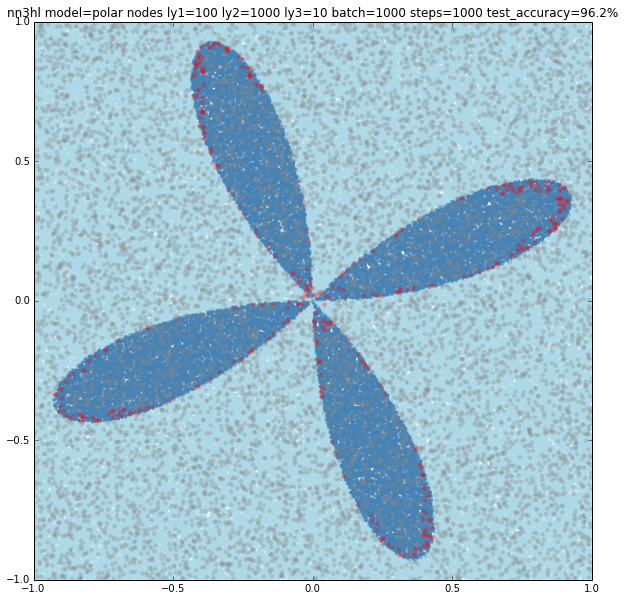

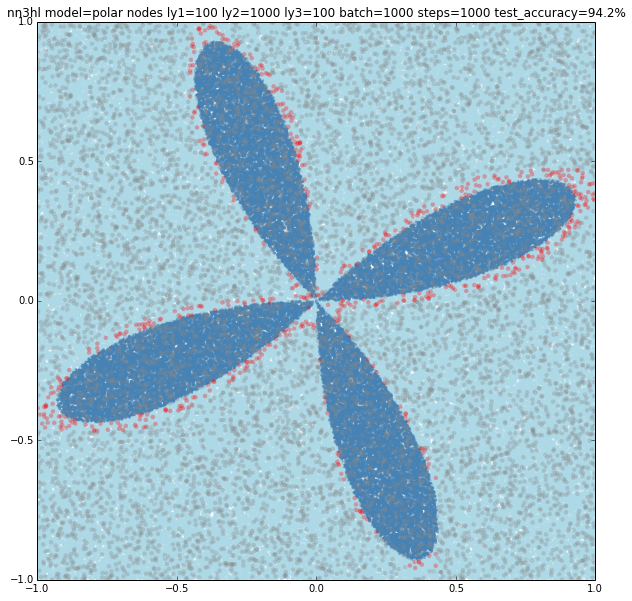

...

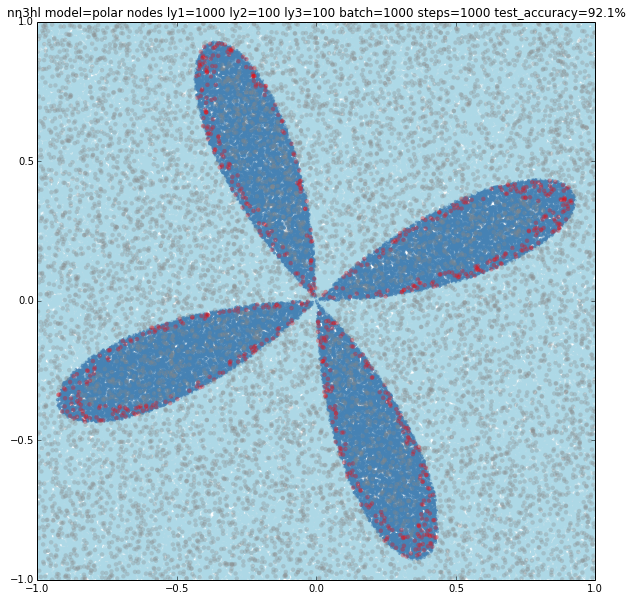

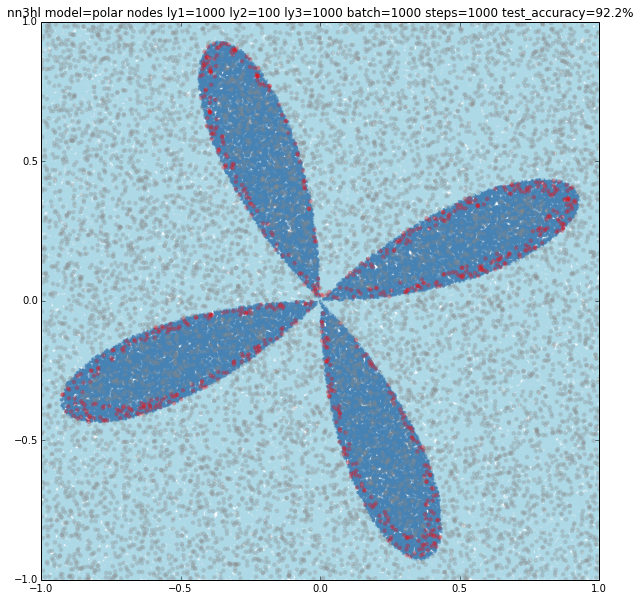

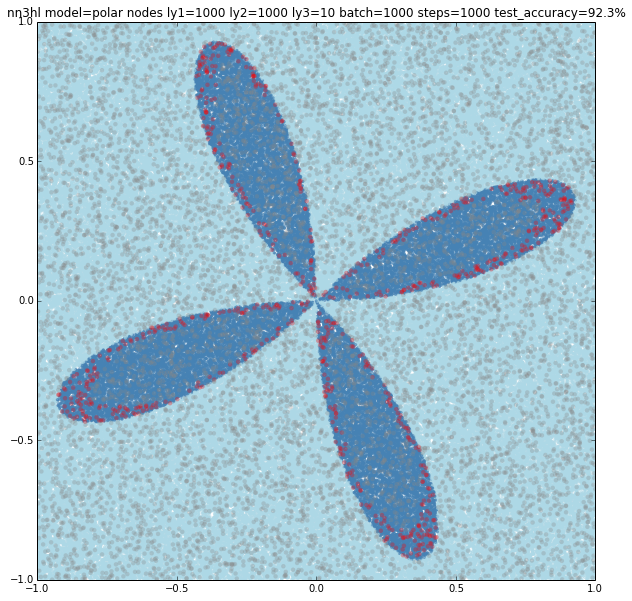

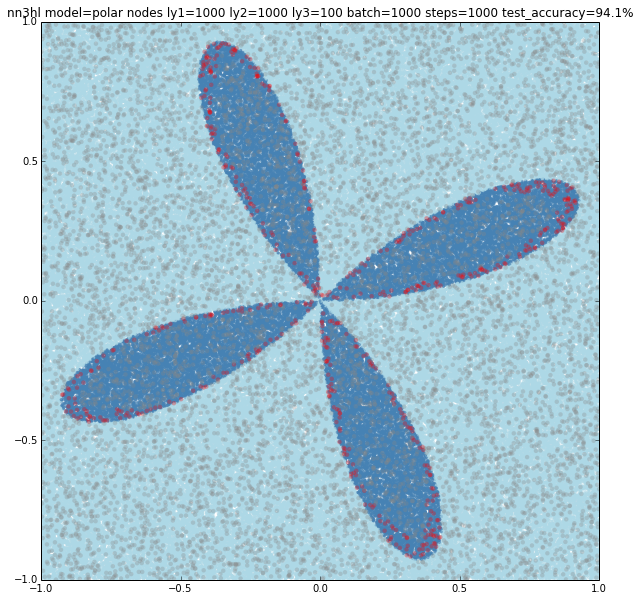

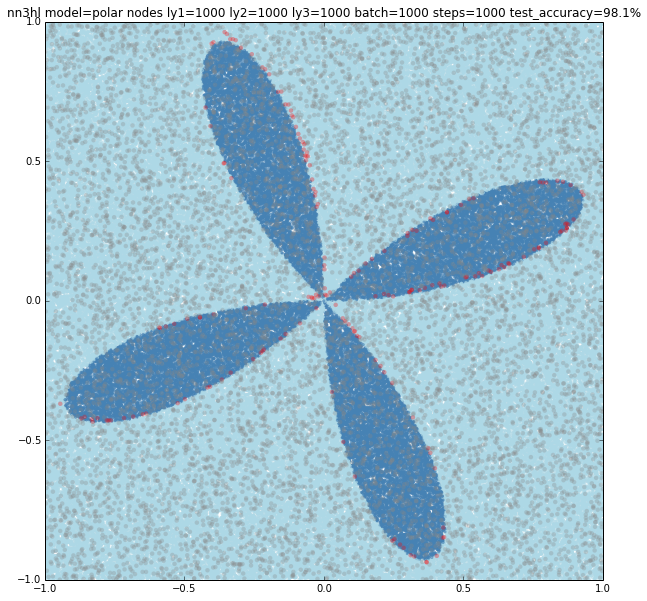

ok


In [135]:
###From Problem 4 - a deeper network: 3 layers & learning rate decay

def nn3hl(fun,num_nodes=1000, num_nodes2=100, num_nodes3=50,
          batch_size=1000,num_steps=3001,
          beta=0.00125,w_init_stddev=0.0441, lr=0.5,
          trace=True):
    #:O??
    step=0
    dt,lt = generate_dataset(fun,train_dataset_size,0)
    ds,ls = generate_dataset(fun,test_dataset_size,1)
    dv,lv = generate_dataset(fun,valid_dataset_size,2)
    #d,l = read_dataset(fun+"_train_dataset.csv",train_dataset_size)
    #d,l = read_dataset(fun+"_valid_dataset.csv",valid_dataset_size)
    #d,l = read_dataset(fun+"_test_dataset.csv",test_dataset_size)

    train_dataset,train_labels = reformat(dt,lt)
    valid_dataset,valid_labels = reformat(ds,ls)
    test_dataset,test_labels = reformat(dv,lv)

    graph = tf.Graph()
    with graph.as_default():
      # Input data. For the training data, we use a placeholder that will be fed
      # at run time with a training minibatch.
      tf_train_dataset = tf.placeholder(tf.float32,
                                        shape=(batch_size, dimensions))
      tf_train_labels = tf.placeholder(tf.float32, shape=(batch_size, num_labels))
      tf_valid_dataset = tf.constant(valid_dataset)
      tf_test_dataset = tf.constant(test_dataset)

      # Variables.
      #efv
      num_nodes_sq = num_nodes2
      num_nodes_h2 = num_nodes3

      weights = tf.Variable(
        tf.truncated_normal([dimensions, num_nodes],stddev=w_init_stddev))
      biases = tf.Variable(tf.zeros([num_nodes]))

      weights_sq = tf.Variable(tf.truncated_normal([num_nodes, num_nodes_sq],stddev=w_init_stddev))
      biases_sq = tf.Variable(tf.zeros([num_nodes_sq]))

      weights2 = tf.Variable(
        tf.truncated_normal([num_nodes_sq, num_nodes_h2],stddev=w_init_stddev))
      biases2 = tf.Variable(tf.zeros([num_nodes_h2]))

      weights_s = tf.Variable(
        tf.truncated_normal([num_nodes_h2, num_labels],stddev=w_init_stddev))
      biases_s = tf.Variable(tf.zeros([num_labels]))

      global_step = tf.Variable(0)  # count the number of steps taken.
      learning_rate = tf.train.exponential_decay(0.5, global_step, 3500, 0.86, staircase=True)

      # Training computation.
      hidden1 = tf.nn.relu(tf.matmul(tf_train_dataset, weights) + biases)
      hidden_sq = tf.nn.relu(tf.matmul(hidden1,weights_sq) + biases_sq)
      hidden2 = tf.nn.relu(tf.matmul(hidden_sq,weights2) + biases2)
      logits = tf.matmul(hidden2, weights_s) + biases_s

      loss = tf.reduce_mean(
        tf.nn.softmax_cross_entropy_with_logits(logits,tf_train_labels) \
        + beta*tf.nn.l2_loss(weights) \
        + beta*tf.nn.l2_loss(weights_sq) \
        + beta*tf.nn.l2_loss(weights2) \
        + beta*tf.nn.l2_loss(weights_s)
      )

      # Optimizer.
      #optimizer = tf.train.GradientDescentOptimizer(0.5).minimize(loss)
      optimizer = tf.train.GradientDescentOptimizer(learning_rate).minimize(loss, global_step=global_step)

      train_prediction = tf.nn.softmax(logits)

    #  hidden1 = tf.nn.relu(tf.matmul(tf_train_dataset, weights) + biases)
    #  hidden_sq = tf.nn.relu(tf.matmul(hidden1,weights_sq) + biases_sq)
    #  hidden2 = tf.nn.relu(tf.matmul(hidden_sq,weights2) + biases2)
    #  logits = tf.matmul(hidden2, weights_s) + biases_s


      valid_prediction = tf.nn.softmax(tf.matmul(tf.nn.relu(tf.matmul(tf.nn.relu(tf.matmul(tf.nn.relu(tf.matmul(tf_valid_dataset, weights) + biases),weights_sq) + biases_sq),weights2) + biases2), weights_s) + biases_s)

    #  tp_hidden1 = tf.nn.relu(tf.matmul(tf_test_dataset, weights) + biases)    
    #  tp_hidden2 = tf.nn.relu(tf.matmul(tp_hidden1,weights2) + biases2)
    #  tp_logits = tf.matmul(tp_hidden2, weights_s) + biases_s
    #  test_prediction = tf.nn.softmax(tp_logits)

      test_prediction = tf.nn.softmax(tf.matmul(tf.nn.relu(tf.matmul(tf.nn.relu(tf.matmul(tf.nn.relu(tf.matmul(tf_test_dataset, weights) + biases),weights_sq) + biases_sq),weights2) + biases2), weights_s) + biases_s)

    with tf.Session(graph=graph) as session:
      tf.initialize_all_variables().run()
      #print("Initialized")
      for step in range(num_steps):
        # Pick an offset within the training data, which has been randomized.
        # Note: we could use better randomization across epochs.
        offset = (step * batch_size) % (train_labels.shape[0] - batch_size)
        # Generate a minibatch.
        batch_data = train_dataset[offset:(offset + batch_size), :]
        batch_labels = train_labels[offset:(offset + batch_size), :]
        # Prepare a dictionary telling the session where to feed the minibatch.
        # The key of the dictionary is the placeholder node of the graph to be fed,
        # and the value is the numpy array to feed to it.
        feed_dict = {tf_train_dataset : batch_data, tf_train_labels : batch_labels}
        _, l, predictions = session.run(
          [optimizer, loss, train_prediction], feed_dict=feed_dict)
        if (step % 500 == 0) and trace:
          print("Minibatch loss at step %d: %f" % (step, l))
          print("Minibatch accuracy: %.1f%%" % accuracy(predictions, batch_labels))
          print("Validation accuracy: %.1f%%" % accuracy(
            valid_prediction.eval(), valid_labels))
      accu = accuracy(test_prediction.eval(), test_labels)
      #print("Test accuracy: %.1f%%" % accu)
      pp = test_prediction.eval()
      #save_predictions(pp,test_labels,fun)
      plot_title = "nn3hl model=%s nodes ly1=%d ly2=%d ly3=%d batch=%d steps=%d test_accuracy=%.1f%%" % (
            fun.__name__, num_nodes, num_nodes2, num_nodes3, batch_size, num_steps, accu)
      plot_predictions(train_dataset,train_labels,test_dataset,test_labels,pp,title=plot_title)


#Try this for a huge set of results
#for model in (ring,cos,polar):
#    for n1 in (100,1000):
#        for n2 in (100,1000):
#            for n3 in (10,50):
#                bs = 1000
#                for s in (1001,6001):
#                    #print("steps %d" % s)
#                    nn3hl(model, num_nodes=n1, num_nodes2=n2, num_nodes3=n3, 
#                          batch_size=bs, num_steps=s, trace=True)  


#cosine, iterative
#for n1 in (100,1000):
#    for n2 in (100,1000):
#        for n3 in (10,100,1000):
#            nn3hl(cos,num_nodes=n1, num_nodes2=n2, num_nodes3=n3, batch_size=1000, num_steps=1000, trace=False)

for n1 in (100,1000):
    for n2 in (100,1000):
        for n3 in (10,100,1000):
            nn3hl(polar,num_nodes=n1, num_nodes2=n2, num_nodes3=n3, batch_size=1000, num_steps=1000, trace=False)

#nn3hl(fun=circle, num_nodes=10, num_nodes2=10, num_nodes3=10, batch_size=1000, num_steps=1000, trace=False)    
print("ok")

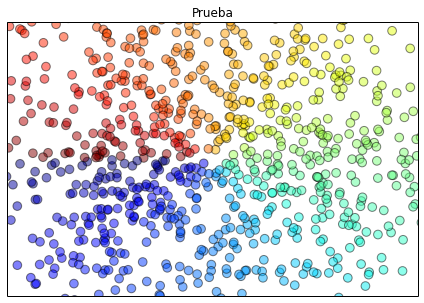

In [119]:
#pruebas - just ignore this ;)

import numpy as np
import matplotlib.pyplot as plt

%matplotlib inline

def myplot(num):

    n = num
    X = np.random.normal(0, 1, n)
    Y = np.random.normal(0, 1, n)
    T = np.arctan2(Y, X)

    plt.axes([0.025, 0.025, 0.95, 0.95])
    plt.scatter(X, Y, s=75, c=T, alpha=.5)

    plt.xlim(-1.5, 1.5)
    plt.xticks(())
    plt.ylim(-1.5, 1.5)
    plt.yticks(())
    
    plt.title("Prueba")

    plt.show()

myplot(1024)
#print( test_labels )

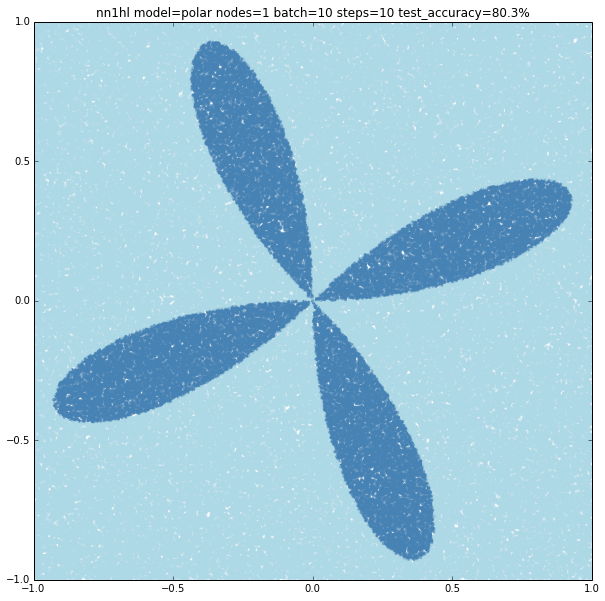

Total time 8.521972


In [13]:
nn1hl(fun=polar, num_nodes=1, num_steps = 10, batch_size=10, trace=False)